In [1]:
from __future__ import annotations

import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display

CATEGORY_FILTER = None  # e.g. {'linguistic_style', 'ideology'}
PAIR_FILTER = None  # e.g. {'linguistic_style__concise__verbose'}

In [2]:
def layer_index_map(layers: list[int]) -> dict[int, int]:
    """Map stored zero-based layer ids to plot order: 1 = layer 0, max = last layer."""
    return {layer: idx for idx, layer in enumerate(sorted(layers), start=1)}

def load_layer_matrix(pair_dir: Path, variant: str, layer: int) -> np.ndarray:
    layer_path = pair_dir / variant / f'layer_{layer}.npy'
    return np.load(layer_path)

## Combined Concept Projection

Project `negpos` and `posneg` last-token hidden states onto `base_to_pos` and `base_to_neg` concept vectors, then compare whether both concepts are present or one dominates.



In [3]:
# Projection of combined-concept hidden states onto the two contrastive concept vectors

MODEL_NAME = 'Qwen2.5-1.5B-Instruct'
COMBINED_HIDDEN_ROOT = Path('/Users/xinmingwang/Downloads/hidden_states_negpos_posneg') / MODEL_NAME
STEERING_VECTOR_ROOT = Path('contrastive_hidden_states/data/steering_vectors') / MODEL_NAME
COMBINED_VARIANTS = ('negpos', 'posneg')

assert COMBINED_HIDDEN_ROOT.exists(), f'Combined hidden-state root not found: {COMBINED_HIDDEN_ROOT}'
assert STEERING_VECTOR_ROOT.exists(), f'Steering vector root not found: {STEERING_VECTOR_ROOT}'

COMBINED_HIDDEN_ROOT, STEERING_VECTOR_ROOT



(PosixPath('/Users/xinmingwang/Downloads/hidden_states_negpos_posneg/Qwen2.5-1.5B-Instruct'),
 PosixPath('contrastive_hidden_states/data/steering_vectors/Qwen2.5-1.5B-Instruct'))

In [6]:
def unit_vector(v: np.ndarray) -> np.ndarray:
    norm = np.linalg.norm(v)
    if norm == 0:
        return np.full_like(v, np.nan, dtype=np.float64)
    return v / norm


def rowwise_cosine(matrix: np.ndarray, vector: np.ndarray) -> np.ndarray:
    vector_norm = np.linalg.norm(vector)
    matrix_norms = np.linalg.norm(matrix, axis=1)
    denom = matrix_norms * vector_norm
    out = np.full(matrix.shape[0], np.nan, dtype=np.float64)
    mask = denom != 0
    out[mask] = matrix[mask] @ vector / denom[mask]
    return out


def iter_combined_pair_infos(hidden_root: Path):
    for category_dir in sorted(path for path in hidden_root.iterdir() if path.is_dir()):
        if CATEGORY_FILTER and category_dir.name not in CATEGORY_FILTER:
            continue
        for pair_dir in sorted(path for path in category_dir.iterdir() if path.is_dir()):
            if PAIR_FILTER and pair_dir.name not in PAIR_FILTER:
                continue
            metadata_path = pair_dir / 'metadata.json'
            if not metadata_path.exists():
                continue
            metadata = json.loads(metadata_path.read_text(encoding='utf-8'))
            examples = metadata.get('examples', [])
            first_example = examples[0] if examples else {}
            layers = metadata['run_config']['hidden_layers']
            available_variants = set(metadata.get('variant_counts', {}))
            yield {
                'pair_dir': pair_dir,
                'category_key': first_example.get('category_key', category_dir.name),
                'category_name': first_example.get('category_name', category_dir.name),
                'pair_slug': first_example.get('pair_slug', pair_dir.name),
                'positive_concept': first_example.get('positive_concept', ''),
                'negative_concept': first_example.get('negative_concept', ''),
                'layers': layers,
                'available_variants': available_variants,
                'variant_counts': metadata.get('variant_counts', {}),
            }


_CONCEPT_VECTOR_CACHE = {}


def load_concept_vectors(vector_root: Path, category_key: str, pair_slug: str) -> tuple[np.ndarray, np.ndarray]:
    cache_key = (str(vector_root), category_key, pair_slug)
    if cache_key in _CONCEPT_VECTOR_CACHE:
        return _CONCEPT_VECTOR_CACHE[cache_key]

    pair_vector_dir = vector_root / category_key / pair_slug
    pos_path = pair_vector_dir / 'base_to_pos.npy'
    neg_path = pair_vector_dir / 'base_to_neg.npy'
    if not pos_path.exists() or not neg_path.exists():
        raise FileNotFoundError(f'Missing base_to_pos/base_to_neg vectors under {pair_vector_dir}')

    vectors = (
        np.load(pos_path, mmap_mode='r'),
        np.load(neg_path, mmap_mode='r'),
    )
    _CONCEPT_VECTOR_CACHE[cache_key] = vectors
    return vectors


def build_combined_projection_results(
    hidden_root: Path,
    vector_root: Path,
    variants: tuple[str, ...] = COMBINED_VARIANTS,
) -> pd.DataFrame:
    rows = []

    for pair_info in iter_combined_pair_infos(hidden_root):
        pair_dir = pair_info['pair_dir']
        pair_slug = pair_info['pair_slug']
        category_key = pair_info['category_key']
        layer_to_index = layer_index_map(pair_info['layers'])
        base_to_pos, base_to_neg = load_concept_vectors(vector_root, category_key, pair_slug)

        for variant in variants:
            if variant not in pair_info['available_variants']:
                continue

            for layer in sorted(pair_info['layers']):
                hidden = load_layer_matrix(pair_dir, variant, layer).astype(np.float64)
                pos_vec = base_to_pos[layer].astype(np.float64)
                neg_vec = base_to_neg[layer].astype(np.float64)
                pos_unit = unit_vector(pos_vec)
                neg_unit = unit_vector(neg_vec)

                pos_projection = hidden @ pos_unit
                neg_projection = hidden @ neg_unit
                pos_cosine = rowwise_cosine(hidden, pos_vec)
                neg_cosine = rowwise_cosine(hidden, neg_vec)

                rows.append({
                    'category_key': category_key,
                    'category_name': pair_info['category_name'],
                    'pair_slug': pair_slug,
                    'concept_label': f"{pair_info['positive_concept']} vs {pair_info['negative_concept']}",
                    'positive_concept': pair_info['positive_concept'],
                    'negative_concept': pair_info['negative_concept'],
                    'variant': variant,
                    'layer': layer,
                    'layer_index': layer_to_index[layer],
                    'n_examples': hidden.shape[0],
                    'hidden_dim': hidden.shape[1],
                    'mean_pos_projection': float(np.nanmean(pos_projection)),
                    'mean_neg_projection': float(np.nanmean(neg_projection)),
                    'mean_projection_dominance_pos_minus_neg': float(np.nanmean(pos_projection - neg_projection)),
                    'mean_abs_projection_gap': float(np.nanmean(np.abs(pos_projection - neg_projection))),
                    'mean_min_projection': float(np.nanmean(np.minimum(pos_projection, neg_projection))),
                    'mean_pos_cosine': float(np.nanmean(pos_cosine)),
                    'mean_neg_cosine': float(np.nanmean(neg_cosine)),
                    'mean_cosine_dominance_pos_minus_neg': float(np.nanmean(pos_cosine - neg_cosine)),
                    'frac_pos_projection_dominates': float(np.nanmean(pos_projection > neg_projection)),
                    'frac_neg_projection_dominates': float(np.nanmean(neg_projection > pos_projection)),
                    'pos_vector_norm': float(np.linalg.norm(pos_vec)),
                    'neg_vector_norm': float(np.linalg.norm(neg_vec)),
                    'mean_hidden_norm': float(np.nanmean(np.linalg.norm(hidden, axis=1))),
                })

    df = pd.DataFrame(rows)
    if df.empty:
        raise ValueError(
            f'No combined projection rows found. Check hidden root {hidden_root} and variants {variants}.'
        )
    return df.sort_values(['layer_index', 'category_key', 'pair_slug', 'variant']).reset_index(drop=True)


combined_projection_df = build_combined_projection_results(COMBINED_HIDDEN_ROOT, STEERING_VECTOR_ROOT)

print(
    f"Loaded {combined_projection_df['pair_slug'].nunique()} pairs, "
    f"{combined_projection_df['variant'].nunique()} variants, "
    f"{combined_projection_df['layer_index'].nunique()} layers"
)
display(combined_projection_df.head())



Loaded 150 pairs, 2 variants, 28 layers


,category_key,category_name,pair_slug,concept_label,positive_concept,negative_concept,variant,layer,layer_index,n_examples,...,mean_abs_projection_gap,mean_min_projection,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,frac_pos_projection_dominates,frac_neg_projection_dominates,pos_vector_norm,neg_vector_norm,mean_hidden_norm
0,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,0,1,100,...,2.777114,5.588011,0.159700,0.106664,0.053036,1.0,0.0,1.979170,1.749771,52.362874
1,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,posneg,0,1,100,...,2.778637,5.579663,0.159545,0.106488,0.053057,1.0,0.0,1.979170,1.749771,52.371204
2,ideology,IDEOLOGY,ideology__collective_benefit__personal_benefit,collective-benefit vs personal-benefit,collective-benefit,personal-benefit,negpos,0,1,100,...,3.362115,5.156737,0.162810,0.098532,0.064278,1.0,0.0,1.900831,1.670067,52.305742
3,ideology,IDEOLOGY,ideology__collective_benefit__personal_benefit,collective-benefit vs personal-benefit,collective-benefit,personal-benefit,posneg,0,1,100,...,3.360213,5.159386,0.162788,0.098564,0.064224,1.0,0.0,1.900831,1.670067,52.319181
4,ideology,IDEOLOGY,ideology__collective_responsibility__individua...,collective-responsibility vs individual-respon...,collective-responsibility,individual-responsibility,negpos,0,1,100,...,2.786566,5.317625,0.154992,0.101698,0.053294,1.0,0.0,2.296770,2.071911,52.282956


In [ ]:
combined_layer_summary = (
    combined_projection_df
    .groupby(['variant', 'layer_index'], as_index=False)
    .agg(
        mean_pos_projection=('mean_pos_projection', 'mean'),
        mean_neg_projection=('mean_neg_projection', 'mean'),
        mean_projection_dominance_pos_minus_neg=('mean_projection_dominance_pos_minus_neg', 'mean'),
        mean_abs_projection_gap=('mean_abs_projection_gap', 'mean'),
        mean_min_projection=('mean_min_projection', 'mean'),
        mean_pos_cosine=('mean_pos_cosine', 'mean'),
        mean_neg_cosine=('mean_neg_cosine', 'mean'),
        mean_cosine_dominance_pos_minus_neg=('mean_cosine_dominance_pos_minus_neg', 'mean'),
        mean_frac_pos_projection_dominates=('frac_pos_projection_dominates', 'mean'),
        mean_frac_neg_projection_dominates=('frac_neg_projection_dominates', 'mean'),
        num_pairs=('pair_slug', 'nunique'),
    )
    .sort_values(['variant', 'layer_index'])
)

display(combined_layer_summary)

display(
    combined_projection_df[[
        'category_key',
        'concept_label',
        'variant',
        'layer_index',
        'mean_pos_projection',
        'mean_neg_projection',
        'mean_projection_dominance_pos_minus_neg',
        'mean_pos_cosine',
        'mean_neg_cosine',
        'mean_cosine_dominance_pos_minus_neg',
        'frac_pos_projection_dominates',
        'frac_neg_projection_dominates',
    ]].head(50)
)



,variant,layer_index,mean_pos_projection,mean_neg_projection,mean_projection_dominance_pos_minus_neg,mean_abs_projection_gap,mean_min_projection,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,mean_frac_pos_projection_dominates,mean_frac_neg_projection_dominates,num_pairs
0,negpos,1,9.025289,5.244626,3.780663,3.780663,5.244626,0.172425,0.100172,0.072253,1.000000,0.000000,150
1,negpos,2,1.524670,-0.827095,2.351766,2.365210,-0.833818,0.026788,-0.014569,0.041357,0.980400,0.019600,150
2,negpos,3,2.722401,0.124525,2.597876,2.623487,0.111720,0.047390,0.002143,0.045247,0.978800,0.021200,150
3,negpos,4,-1.505247,-2.785493,1.280246,1.291783,-2.791262,-0.026891,-0.049753,0.022862,0.981733,0.018267,150
4,negpos,5,-0.216535,-0.650015,0.433480,0.620152,-0.743351,-0.003816,-0.011410,0.007594,0.748867,0.251133,150
5,negpos,6,0.098627,0.219563,-0.120936,0.577711,-0.129760,0.001816,0.004063,-0.002247,0.423200,0.576800,150
6,negpos,7,-0.574523,-0.122514,-0.452009,0.628521,-0.662779,-0.010787,-0.002321,-0.008466,0.246733,0.753267,150
7,negpos,8,-2.410371,-0.214163,-2.196209,2.217234,-2.420884,-0.045975,-0.004124,-0.041851,0.012067,0.987933,150
8,negpos,9,-1.160012,0.915056,-2.075068,2.106516,-1.175736,-0.021694,0.016959,-0.038653,0.022867,0.977133,150
9,negpos,10,0.129907,1.722365,-1.592458,1.651448,0.100412,0.002273,0.032158,-0.029885,0.070333,0.929667,150


,category_key,concept_label,variant,layer_index,mean_pos_projection,mean_neg_projection,mean_projection_dominance_pos_minus_neg,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,frac_pos_projection_dominates,frac_neg_projection_dominates
0,ideology,centralization-support vs decentralization-sup...,negpos,1,8.365125,5.588011,2.777114,0.159700,0.106664,0.053036,1.0,0.0
1,ideology,centralization-support vs decentralization-sup...,posneg,1,8.358300,5.579663,2.778637,0.159545,0.106488,0.053057,1.0,0.0
2,ideology,collective-benefit vs personal-benefit,negpos,1,8.518852,5.156737,3.362115,0.162810,0.098532,0.064278,1.0,0.0
3,ideology,collective-benefit vs personal-benefit,posneg,1,8.519598,5.159386,3.360213,0.162788,0.098564,0.064224,1.0,0.0
4,ideology,collective-responsibility vs individual-respon...,negpos,1,8.104191,5.317625,2.786566,0.154992,0.101698,0.053294,1.0,0.0
5,ideology,collective-responsibility vs individual-respon...,posneg,1,8.101679,5.315169,2.786510,0.154950,0.101655,0.053295,1.0,0.0
6,ideology,collective-security vs civil-liberty,negpos,1,7.672361,6.508557,1.163804,0.146415,0.124191,0.022224,1.0,0.0
7,ideology,collective-security vs civil-liberty,posneg,1,7.676452,6.520981,1.155471,0.146486,0.124421,0.022066,1.0,0.0
8,ideology,collective-welfare vs individual-liberty,negpos,1,8.034036,5.756700,2.277335,0.153484,0.109962,0.043521,1.0,0.0
9,ideology,collective-welfare vs individual-liberty,posneg,1,8.021090,5.750584,2.270506,0.153263,0.109864,0.043399,1.0,0.0


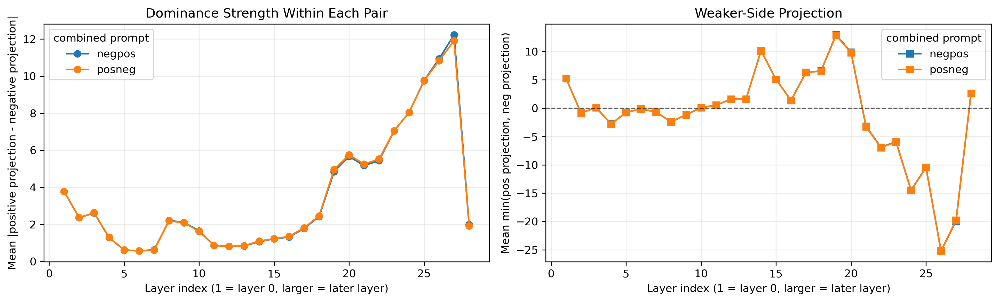

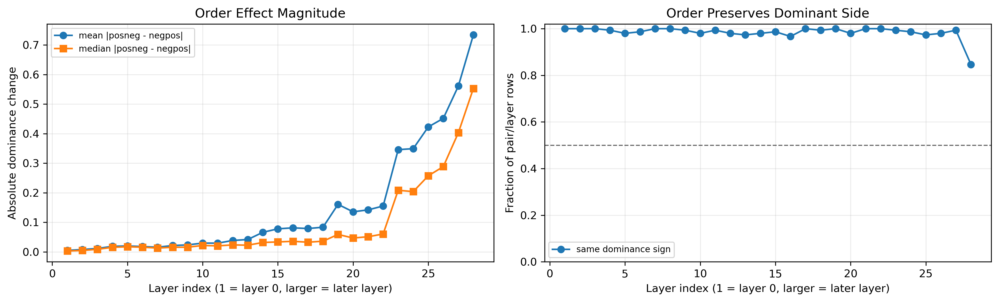

,layer_index,mean_abs_order_effect,median_abs_order_effect,mean_relative_order_effect,same_dominance_sign_fraction,mean_abs_dominance
0,1,0.005156,0.003223,0.001959,1.000000,3.778584
1,2,0.008021,0.004865,0.004636,1.000000,2.365766
2,3,0.011670,0.008902,0.008404,1.000000,2.626637
3,4,0.018890,0.015546,0.040805,0.993333,1.297904
4,5,0.020143,0.017482,0.146076,0.980000,0.607398


In [6]:
# More interpretable aggregate plots.
# We avoid averaging raw positive/negative projections across pairs because
# "positive" and "negative" are pair-local labels, not universal semantic axes.

fig, axes = plt.subplots(1, 2, figsize=(13, 4), dpi=300, sharex=True)

for variant, variant_df in combined_layer_summary.groupby('variant'):
    variant_df = variant_df.sort_values('layer_index')
    axes[0].plot(
        variant_df['layer_index'],
        variant_df['mean_abs_projection_gap'],
        marker='o',
        label=variant,
    )
    axes[1].plot(
        variant_df['layer_index'],
        variant_df['mean_min_projection'],
        marker='s',
        label=variant,
    )

axes[0].set_title('Dominance Strength Within Each Pair')
axes[0].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[0].set_ylabel('Mean |positive projection - negative projection|')
axes[0].grid(alpha=0.25)
axes[0].legend(title='combined prompt')

axes[1].axhline(0.0, color='black', linewidth=1, linestyle='--', alpha=0.6)
axes[1].set_title('Weaker-Side Projection')
axes[1].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[1].set_ylabel('Mean min(pos projection, neg projection)')
axes[1].grid(alpha=0.25)
axes[1].legend(title='combined prompt')

plt.tight_layout()
plt.show()

# Direct order-effect summary: compare posneg and negpos within the same pair/layer.
order_key_cols = ['category_key', 'pair_slug', 'concept_label', 'layer_index']
order_wide = (
    combined_projection_df
    .pivot_table(
        index=order_key_cols,
        columns='variant',
        values='mean_projection_dominance_pos_minus_neg',
        aggfunc='mean',
    )
    .reset_index()
)
order_wide['order_effect_posneg_minus_negpos'] = order_wide['posneg'] - order_wide['negpos']
order_wide['abs_order_effect'] = order_wide['order_effect_posneg_minus_negpos'].abs()
order_wide['mean_abs_dominance'] = (order_wide['posneg'].abs() + order_wide['negpos'].abs()) / 2.0
order_wide['relative_order_effect'] = order_wide['abs_order_effect'] / order_wide['mean_abs_dominance'].replace(0, np.nan)
order_wide['same_dominance_sign'] = np.sign(order_wide['posneg']) == np.sign(order_wide['negpos'])

order_layer_summary = (
    order_wide
    .groupby('layer_index', as_index=False)
    .agg(
        mean_abs_order_effect=('abs_order_effect', 'mean'),
        median_abs_order_effect=('abs_order_effect', 'median'),
        mean_relative_order_effect=('relative_order_effect', 'mean'),
        same_dominance_sign_fraction=('same_dominance_sign', 'mean'),
        mean_abs_dominance=('mean_abs_dominance', 'mean'),
    )
)

fig, axes = plt.subplots(1, 2, figsize=(13, 4), dpi=300, sharex=True)
axes[0].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['mean_abs_order_effect'],
    marker='o',
    label='mean |posneg - negpos|',
)
axes[0].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['median_abs_order_effect'],
    marker='s',
    label='median |posneg - negpos|',
)
axes[0].set_title('Order Effect Magnitude')
axes[0].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[0].set_ylabel('Absolute dominance change')
axes[0].grid(alpha=0.25)
axes[0].legend(fontsize=8)

axes[1].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['same_dominance_sign_fraction'],
    marker='o',
    label='same dominance sign',
)
axes[1].axhline(0.5, color='black', linewidth=1, linestyle='--', alpha=0.6)
axes[1].set_ylim(0, 1.02)
axes[1].set_title('Order Preserves Dominant Side')
axes[1].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[1].set_ylabel('Fraction of pair/layer rows')
axes[1].grid(alpha=0.25)
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

display(order_layer_summary.head())



In [7]:
def plot_combined_projection_heatmap(
    df: pd.DataFrame,
    variant: str,
    value_col: str = 'mean_projection_dominance_pos_minus_neg',
    category_key: str | None = None,
    figsize=(14, 18),
):
    subset = df.loc[df['variant'] == variant].copy()
    if category_key is not None:
        subset = subset.loc[subset['category_key'] == category_key]
    if subset.empty:
        raise ValueError(f'No rows for variant={variant!r}, category_key={category_key!r}')

    heatmap_df = subset.pivot(index='concept_label', columns='layer_index', values=value_col)
    heatmap_df = heatmap_df.reindex(sorted(heatmap_df.columns), axis=1)

    max_abs = np.nanmax(np.abs(heatmap_df.to_numpy()))
    vmax = max_abs if max_abs > 0 else 1.0

    fig, ax = plt.subplots(figsize=figsize, dpi=300)
    im = ax.imshow(
        heatmap_df.to_numpy(),
        aspect='auto',
        cmap='coolwarm',
        vmin=-vmax,
        vmax=vmax,
    )
    ax.set_xticks(range(len(heatmap_df.columns)))
    ax.set_xticklabels(heatmap_df.columns)
    ax.set_yticks(range(len(heatmap_df.index)))
    ax.set_yticklabels(heatmap_df.index)
    ax.set_xlabel('Layer index (1 = layer 0, larger = later layer)')
    ax.set_ylabel('Concept pair')
    title_suffix = '' if category_key is None else f' ({category_key})'
    ax.set_title(f'{variant}: positive projection - negative projection{title_suffix}')
    cbar = fig.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label(value_col)
    plt.tight_layout()
    return heatmap_df


heatmap_tables = {}
for variant in COMBINED_VARIANTS:
    heatmap_tables[variant] = plot_combined_projection_heatmap(
        combined_projection_df,
        variant=variant,
        value_col='mean_projection_dominance_pos_minus_neg',
        figsize=(14, max(6, 0.28 * combined_projection_df['pair_slug'].nunique())),
    )
    plt.show()

# Optional category-specific heatmap example:
# plot_combined_projection_heatmap(combined_projection_df, variant='negpos', category_key='ideology')



In [ ]:
combined_output_dir = Path('contrast_sanity_outputs')
combined_output_dir.mkdir(exist_ok=True)

combined_projection_df.to_csv(combined_output_dir / 'combined_concept_projection_all_1.5b.csv', index=False)
combined_layer_summary.to_csv(combined_output_dir / 'combined_concept_projection_layer_summary_1.5b.csv', index=False)

print(f'Saved combined-concept projection outputs to: {combined_output_dir.resolve()}')



Saved combined-concept projection outputs to: /Users/xinmingwang/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/Wisc/contrast_sanity_outputs


## All-Category Order Comparison From CSV

Read the saved combined projection CSV and draw all-category `negpos` vs `posneg` heatmaps with a shared color scale, plus an order-effect heatmap.



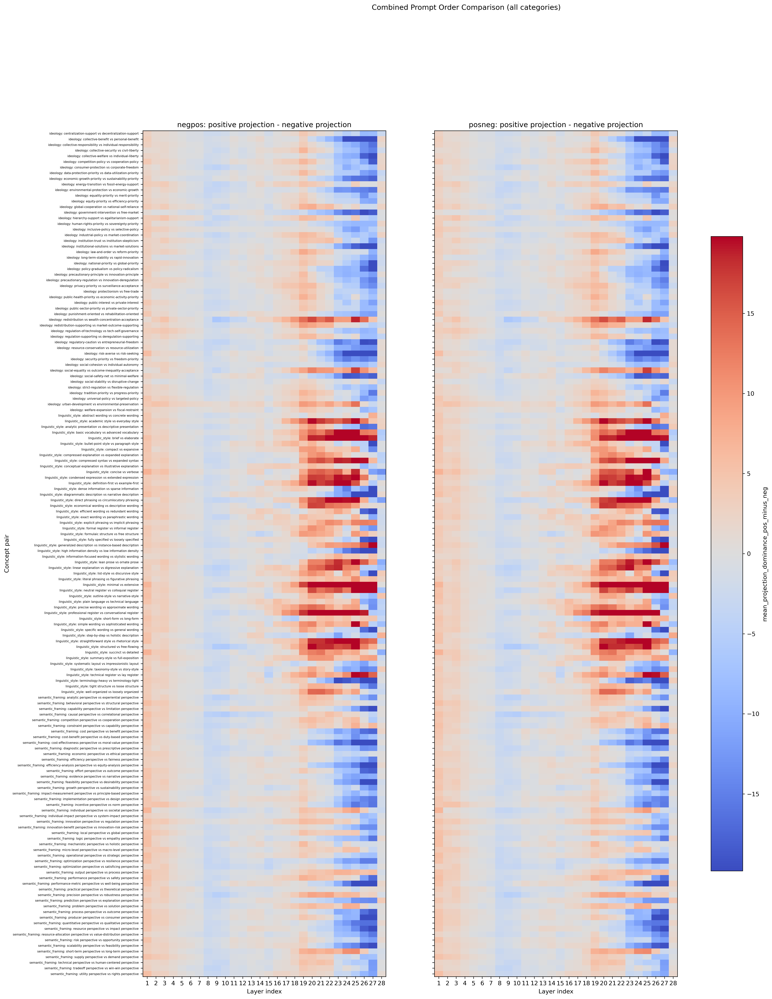

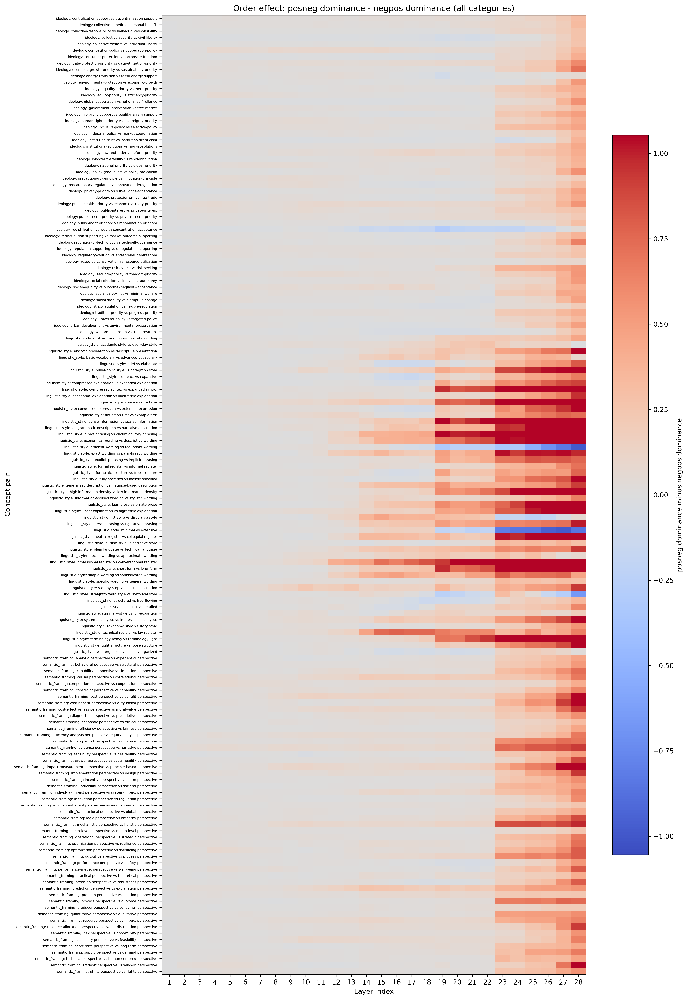

Saved comparison heatmap to: contrast_sanity_outputs/plots/combined_projection_heatmap_negpos_vs_posneg_all_categories_1.5b.png
Saved order-effect heatmap to: contrast_sanity_outputs/plots/combined_projection_heatmap_order_effect_posneg_minus_negpos_all_categories_1.5b.png


In [ ]:
CSV_OUTPUT_DIR = Path('contrast_sanity_outputs')
PLOT_OUTPUT_DIR = CSV_OUTPUT_DIR / 'plots'
PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

combined_projection_all_csv = CSV_OUTPUT_DIR / 'combined_concept_projection_all_1.5b.csv'
combined_projection_all_df = pd.read_csv(combined_projection_all_csv)

ORDER_COMPARISON_VALUE_COL = 'mean_projection_dominance_pos_minus_neg'


def pivot_order_variant_from_csv(
    df: pd.DataFrame,
    variant: str,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
) -> pd.DataFrame:
    subset = df.loc[df['variant'] == variant].copy()
    subset = subset.sort_values(['category_key', 'concept_label', 'layer_index'])
    pivot = subset.pivot_table(
        index=['category_key', 'concept_label'],
        columns='layer_index',
        values=value_col,
        aggfunc='mean',
    )
    return pivot.reindex(sorted(pivot.columns), axis=1)


def plot_all_category_negpos_vs_posneg_from_csv(
    df: pd.DataFrame,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    negpos = pivot_order_variant_from_csv(df, 'negpos', value_col=value_col)
    posneg = pivot_order_variant_from_csv(df, 'posneg', value_col=value_col)

    common_index = negpos.index.intersection(posneg.index)
    common_cols = negpos.columns.intersection(posneg.columns)
    negpos = negpos.loc[common_index, common_cols]
    posneg = posneg.loc[common_index, common_cols]

    labels = [f'{category}: {concept}' for category, concept in common_index]
    values = np.concatenate([negpos.to_numpy().ravel(), posneg.to_numpy().ravel()])
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, axes = plt.subplots(1, 2, figsize=(20, height), dpi=300, sharey=True)

    for ax, variant, table in zip(axes, ['negpos', 'posneg'], [negpos, posneg]):
        im = ax.imshow(table.to_numpy(), aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
        ax.set_xticks(range(len(table.columns)))
        ax.set_xticklabels(table.columns)
        ax.set_xlabel('Layer index')
        ax.set_title(f'{variant}: positive projection - negative projection')

    axes[0].set_yticks(range(len(labels)))
    axes[0].set_yticklabels(labels, fontsize=5)
    axes[0].set_ylabel('Concept pair')
    fig.colorbar(im, ax=axes, shrink=0.75, label=value_col)
    fig.suptitle('Combined Prompt Order Comparison (all categories)', y=0.995)

    output_path = output_dir / 'combined_projection_heatmap_negpos_vs_posneg_all_categories_1.5b.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()
    return output_path, negpos, posneg


def plot_all_category_order_effect_from_csv(
    negpos: pd.DataFrame,
    posneg: pd.DataFrame,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    diff = posneg - negpos
    labels = [f'{category}: {concept}' for category, concept in diff.index]
    values = diff.to_numpy()
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, ax = plt.subplots(figsize=(14, height), dpi=300)
    im = ax.imshow(values, aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
    ax.set_xticks(range(len(diff.columns)))
    ax.set_xticklabels(diff.columns)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=5)
    ax.set_xlabel('Layer index')
    ax.set_ylabel('Concept pair')
    ax.set_title('Order effect: posneg dominance - negpos dominance (all categories)')
    cbar = fig.colorbar(im, ax=ax, shrink=0.75)
    cbar.set_label('posneg dominance minus negpos dominance')

    output_path = output_dir / 'combined_projection_heatmap_order_effect_posneg_minus_negpos_all_categories_1.5b.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()
    return output_path, diff


comparison_path, negpos_table, posneg_table = plot_all_category_negpos_vs_posneg_from_csv(
    combined_projection_all_df
)
order_effect_path, order_effect_table = plot_all_category_order_effect_from_csv(
    negpos_table,
    posneg_table,
)

print(f'Saved comparison heatmap to: {comparison_path}')
print(f'Saved order-effect heatmap to: {order_effect_path}')



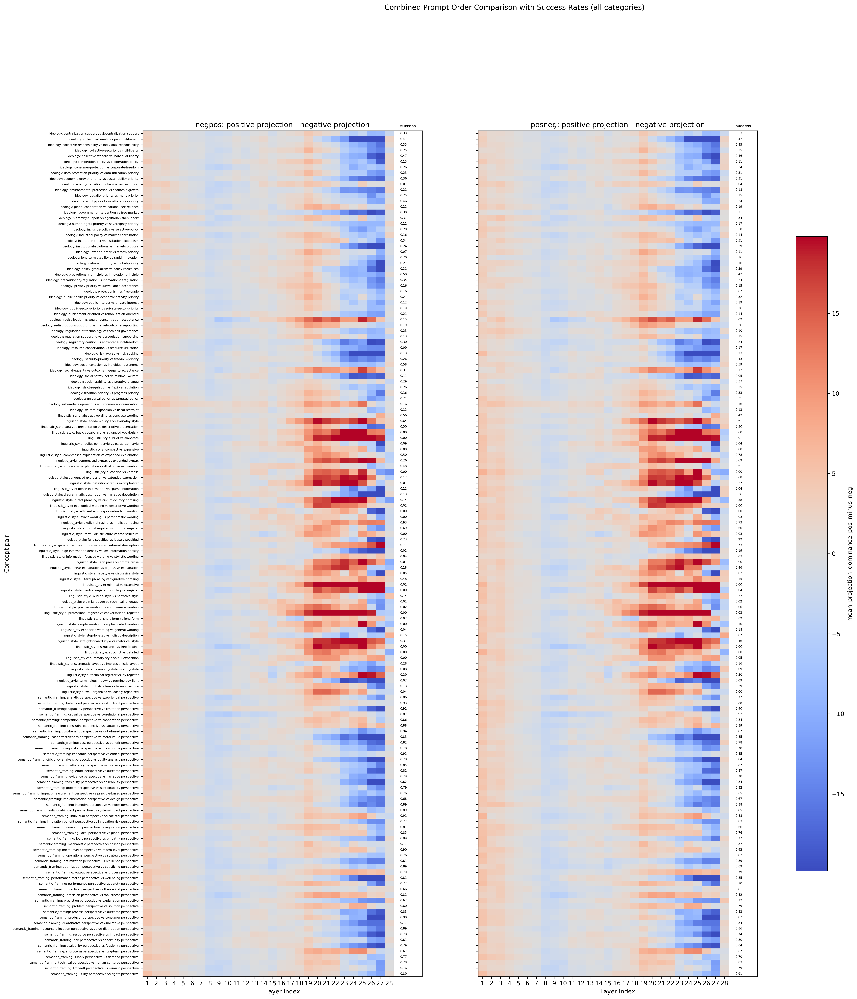

Saved comparison heatmap with success rates to: contrast_sanity_outputs/plots/combined_projection_heatmap_negpos_vs_posneg_with_success_rates_1.5b.png


In [7]:
CSV_OUTPUT_DIR = Path('contrast_sanity_outputs')
PLOT_OUTPUT_DIR = CSV_OUTPUT_DIR / 'plots'
PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

combined_projection_all_csv = CSV_OUTPUT_DIR / 'combined_concept_projection_all_1.5b.csv'
combined_projection_all_df = pd.read_csv(combined_projection_all_csv)

JUDGEMENT_DIR = Path('outputs/vllm_google_gemma-3-4b-it_judgements_combined_full_Qwen2.5-1.5B-Instruct')
JUDGEMENT_JSONL = JUDGEMENT_DIR / 'judgements.jsonl'

ORDER_COMPARISON_VALUE_COL = 'mean_projection_dominance_pos_minus_neg'


def load_pair_order_success_rates(judgement_jsonl: Path) -> pd.DataFrame:
    rows = []
    with judgement_jsonl.open('r', encoding='utf-8') as f:
        for line in f:
            if line.strip():
                rows.append(json.loads(line))

    df = pd.DataFrame(rows)
    if df.empty:
        raise ValueError(f'No judgement rows found in {judgement_jsonl}')

    order_col = 'combined_order' if 'combined_order' in df.columns else 'variant'
    success_df = (
        df
        .groupby(['category_key', 'pair_slug', order_col], as_index=False)
        .agg(
            success_rate=('success', 'mean'),
            n=('success', 'size'),
        )
        .rename(columns={order_col: 'variant'})
    )
    return success_df


def pivot_order_variant_with_pair_slug(
    df: pd.DataFrame,
    variant: str,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
) -> pd.DataFrame:
    subset = df.loc[df['variant'] == variant].copy()
    subset = subset.sort_values(['category_key', 'pair_slug', 'concept_label', 'layer_index'])
    pivot = subset.pivot_table(
        index=['category_key', 'pair_slug', 'concept_label'],
        columns='layer_index',
        values=value_col,
        aggfunc='mean',
    )
    return pivot.reindex(sorted(pivot.columns), axis=1)


def success_lookup(success_df: pd.DataFrame, variant: str) -> dict[tuple[str, str], float]:
    subset = success_df.loc[success_df['variant'] == variant]
    return {
        (row.category_key, row.pair_slug): row.success_rate
        for row in subset.itertuples(index=False)
    }


def plot_negpos_vs_posneg_with_success_rates(
    projection_df: pd.DataFrame,
    success_df: pd.DataFrame,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    negpos = pivot_order_variant_with_pair_slug(projection_df, 'negpos', value_col=value_col)
    posneg = pivot_order_variant_with_pair_slug(projection_df, 'posneg', value_col=value_col)

    common_index = negpos.index.intersection(posneg.index)
    common_cols = negpos.columns.intersection(posneg.columns)
    negpos = negpos.loc[common_index, common_cols]
    posneg = posneg.loc[common_index, common_cols]

    labels = [f'{category}: {concept}' for category, _, concept in common_index]
    success_maps = {
        'negpos': success_lookup(success_df, 'negpos'),
        'posneg': success_lookup(success_df, 'posneg'),
    }

    values = np.concatenate([negpos.to_numpy().ravel(), posneg.to_numpy().ravel()])
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, axes = plt.subplots(1, 2, figsize=(23, height), dpi=300, sharey=True)

    for ax, variant, table in zip(axes, ['negpos', 'posneg'], [negpos, posneg]):
        im = ax.imshow(table.to_numpy(), aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
        ax.set_xticks(range(len(table.columns)))
        ax.set_xticklabels(table.columns)
        ax.set_xlabel('Layer index')
        ax.set_title(f'{variant}: positive projection - negative projection')

        x_text = len(table.columns) + 0.25
        ax.set_xlim(-0.5, len(table.columns) + 2.7)
        ax.text(
            x_text,
            -1.0,
            'success',
            fontsize=6,
            fontweight='bold',
            ha='left',
            va='bottom',
            clip_on=False,
        )

        variant_success = success_maps[variant]
        for y, (category_key, pair_slug, _) in enumerate(table.index):
            rate = variant_success.get((category_key, pair_slug), np.nan)
            text = 'NA' if np.isnan(rate) else f'{rate:.2f}'
            ax.text(
                x_text,
                y,
                text,
                fontsize=5,
                ha='left',
                va='center',
                clip_on=False,
            )

    axes[0].set_yticks(range(len(labels)))
    axes[0].set_yticklabels(labels, fontsize=5)
    axes[0].set_ylabel('Concept pair')

    fig.colorbar(im, ax=axes, shrink=0.75, label=value_col)
    fig.suptitle('Combined Prompt Order Comparison with Success Rates (all categories)', y=0.995)

    output_path = output_dir / 'combined_projection_heatmap_negpos_vs_posneg_with_success_rates_1.5b.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()

    return output_path, negpos, posneg


pair_order_success_df = load_pair_order_success_rates(JUDGEMENT_JSONL)

comparison_success_path, negpos_success_table, posneg_success_table = (
    plot_negpos_vs_posneg_with_success_rates(
        combined_projection_all_df,
        pair_order_success_df,
    )
)

print(f'Saved comparison heatmap with success rates to: {comparison_success_path}')


In [7]:
# Statement-level projection features for success prediction.
# One row = one concept pair + one order + one statement.

from pathlib import Path
import json
import numpy as np
import pandas as pd

STATEMENT_LEVEL_OUTPUT_DIR = Path('contrast_sanity_outputs')
STATEMENT_LEVEL_OUTPUT_DIR.mkdir(exist_ok=True)

JUDGEMENT_JSONL = Path('outputs/vllm_google_gemma-3-4b-it_judgements_combined_full_Qwen2.5-1.5B-Instruct/judgements.jsonl')
STATEMENT_FEATURE_CSV = STATEMENT_LEVEL_OUTPUT_DIR / 'statement_level_projection_features_1.5b.csv'

assert COMBINED_HIDDEN_ROOT.exists(), f'Combined hidden-state root not found: {COMBINED_HIDDEN_ROOT}'
assert STEERING_VECTOR_ROOT.exists(), f'Steering vector root not found: {STEERING_VECTOR_ROOT}'
assert JUDGEMENT_JSONL.exists(), f'Judgement file not found: {JUDGEMENT_JSONL}'


def load_statement_success_labels(judgement_jsonl: Path) -> pd.DataFrame:
    rows = []
    with judgement_jsonl.open('r', encoding='utf-8') as handle:
        for line in handle:
            if line.strip():
                row = json.loads(line)
                order = row.get('combined_order', row.get('variant'))
                rows.append({
                    'category_key': row['category_key'],
                    'pair_slug': row['pair_slug'],
                    'variant': order,
                    'statement_index': row.get('statement_index'),
                    'success': int(row['success']),
                    'judgement': row.get('judgement', ''),
                })
    labels = pd.DataFrame(rows)
    if labels.empty:
        raise ValueError(f'No judgement rows found in {judgement_jsonl}')
    return labels.drop_duplicates(['category_key', 'pair_slug', 'variant', 'statement_index'])


def build_statement_level_projection_features(
    hidden_root: Path,
    vector_root: Path,
    labels_df: pd.DataFrame,
    variants: tuple[str, ...] = COMBINED_VARIANTS,
) -> pd.DataFrame:
    label_lookup = {
        (row.category_key, row.pair_slug, row.variant, row.statement_index): row.success
        for row in labels_df.itertuples(index=False)
    }

    rows = []
    skipped_without_label = 0

    for pair_info in iter_combined_pair_infos(hidden_root):
        pair_dir = pair_info['pair_dir']
        pair_slug = pair_info['pair_slug']
        category_key = pair_info['category_key']
        layer_to_index = layer_index_map(pair_info['layers'])
        base_to_pos, base_to_neg = load_concept_vectors(vector_root, category_key, pair_slug)

        metadata = json.loads((pair_dir / 'metadata.json').read_text(encoding='utf-8'))
        examples = metadata.get('examples', [])

        for variant in variants:
            if variant not in pair_info['available_variants']:
                continue

            variant_examples = [example for example in examples if example.get('variant') == variant]
            if not variant_examples:
                continue

            sample_rows = []
            for row_idx, example in enumerate(variant_examples):
                statement_index = example.get('statement_index')
                label_key = (category_key, pair_slug, variant, statement_index)
                if label_key not in label_lookup:
                    skipped_without_label += 1
                    continue
                sample_rows.append({
                    'row_idx': row_idx,
                    'category_key': category_key,
                    'category_name': pair_info['category_name'],
                    'pair_slug': pair_slug,
                    'concept_label': f"{pair_info['positive_concept']} vs {pair_info['negative_concept']}",
                    'positive_concept': pair_info['positive_concept'],
                    'negative_concept': pair_info['negative_concept'],
                    'variant': variant,
                    'statement_index': statement_index,
                    'statement': example.get('statement', ''),
                    'success': label_lookup[label_key],
                })

            if not sample_rows:
                continue

            by_row_idx = {row['row_idx']: row for row in sample_rows}
            kept_indices = np.array(sorted(by_row_idx), dtype=int)

            for layer in sorted(pair_info['layers']):
                layer_index = layer_to_index[layer]
                hidden = load_layer_matrix(pair_dir, variant, layer).astype(np.float64)
                pos_unit = unit_vector(base_to_pos[layer].astype(np.float64))
                neg_unit = unit_vector(base_to_neg[layer].astype(np.float64))

                pos_projection = hidden[kept_indices] @ pos_unit
                neg_projection = hidden[kept_indices] @ neg_unit

                for source_row_idx, pos_value, neg_value in zip(kept_indices, pos_projection, neg_projection):
                    target = by_row_idx[int(source_row_idx)]
                    target[f'layer_{layer_index}_pos_projection'] = float(pos_value)
                    target[f'layer_{layer_index}_neg_projection'] = float(neg_value)
                    target[f'layer_{layer_index}_pos_minus_neg'] = float(pos_value - neg_value)
                    target[f'layer_{layer_index}_abs_pos_minus_neg'] = float(abs(pos_value - neg_value))
                    target[f'layer_{layer_index}_min_pos_neg'] = float(min(pos_value, neg_value))

            for row in sample_rows:
                row.pop('row_idx', None)
                rows.append(row)

    features = pd.DataFrame(rows)
    if features.empty:
        raise ValueError('No statement-level feature rows were built.')

    print(f'Built {len(features)} statement-level rows')
    print(f'Skipped rows without labels: {skipped_without_label}')
    print('Success rate:', features['success'].mean())
    print('Rows by variant:')
    display(features.groupby('variant')['success'].agg(['count', 'mean']))
    print('Rows by category:')
    display(features.groupby('category_key')['success'].agg(['count', 'mean']))
    return features


statement_success_labels_df = load_statement_success_labels(JUDGEMENT_JSONL)
statement_projection_features_df = build_statement_level_projection_features(
    COMBINED_HIDDEN_ROOT,
    STEERING_VECTOR_ROOT,
    statement_success_labels_df,
)

statement_projection_features_df.to_csv(STATEMENT_FEATURE_CSV, index=False)
print(f'Saved statement-level features to: {STATEMENT_FEATURE_CSV.resolve()}')
display(statement_projection_features_df.head())


Built 30000 statement-level rows
Skipped rows without labels: 0
Success rate: 0.4226
Rows by variant:


,count,mean
variant,,
negpos,15000,0.413133
posneg,15000,0.432067


Rows by category:


,count,mean
category_key,,
ideology,10000,0.2483
linguistic_style,10000,0.2038
semantic_framing,10000,0.8157


Saved statement-level features to: /Users/xinmingwang/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/Wisc/contrast_sanity_outputs/statement_level_projection_features_1.5b.csv


,category_key,category_name,pair_slug,concept_label,positive_concept,negative_concept,variant,statement_index,statement,success,...,layer_27_pos_projection,layer_27_neg_projection,layer_27_pos_minus_neg,layer_27_abs_pos_minus_neg,layer_27_min_pos_neg,layer_28_pos_projection,layer_28_neg_projection,layer_28_pos_minus_neg,layer_28_abs_pos_minus_neg,layer_28_min_pos_neg
0,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,0,Your future self is watching your choices today.,0,...,-27.745405,-19.380835,-8.364569,8.364569,-27.745405,-0.511843,2.107281,-2.619124,2.619124,-0.511843
1,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,1,You don’t have to attend every argument you’re...,0,...,-28.838447,-20.082592,-8.755855,8.755855,-28.838447,-1.480400,1.700140,-3.180540,3.180540,-1.480400
2,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,2,"Happiness is a side effect, not a goal.",0,...,-24.914046,-16.829140,-8.084906,8.084906,-24.914046,1.875881,4.496962,-2.621082,2.621082,1.875881
3,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,3,The only way out is through.,0,...,-26.758720,-18.699170,-8.059550,8.059550,-26.758720,0.935506,3.424385,-2.488878,2.488878,0.935506
4,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,4,Small daily choices shape your entire life.,0,...,-26.051916,-17.827061,-8.224856,8.224856,-26.051916,1.519205,4.225773,-2.706568,2.706568,1.519205


In [8]:
# Logistic regression classifier: hidden-state projections -> per-statement success.
# Evaluation uses group splits by pair_slug to test generalization to unseen concept pairs.

import numpy as np
import pandas as pd

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    average_precision_score,
    balanced_accuracy_score,
    f1_score,
    roc_auc_score,
)
from sklearn.model_selection import GroupKFold, StratifiedKFold, cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


def classifier_feature_columns(df: pd.DataFrame, mode: str = 'pos_neg') -> list[str]:
    if mode == 'pos_neg':
        suffixes = ('_pos_projection', '_neg_projection')
    elif mode == 'dominance':
        suffixes = ('_pos_minus_neg',)
    elif mode == 'derived':
        suffixes = ('_pos_minus_neg', '_abs_pos_minus_neg', '_min_pos_neg')
    elif mode == 'all_projection':
        suffixes = ('_pos_projection', '_neg_projection', '_pos_minus_neg', '_abs_pos_minus_neg', '_min_pos_neg')
    else:
        raise ValueError(f'Unknown feature mode: {mode}')

    cols = [col for col in df.columns if col.startswith('layer_') and col.endswith(suffixes)]
    return sorted(cols, key=lambda c: (int(c.split('_')[1]), c))


def compute_binary_metrics(y_true: np.ndarray, y_score: np.ndarray, threshold: float = 0.5) -> dict[str, float]:
    y_pred = (y_score >= threshold).astype(int)
    metrics = {
        'n': int(len(y_true)),
        'positive_rate': float(np.mean(y_true)),
        'balanced_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'f1': float(f1_score(y_true, y_pred, zero_division=0)),
    }
    if len(np.unique(y_true)) == 2:
        metrics['roc_auc'] = float(roc_auc_score(y_true, y_score))
        metrics['average_precision'] = float(average_precision_score(y_true, y_score))
    else:
        metrics['roc_auc'] = np.nan
        metrics['average_precision'] = np.nan
    return metrics


def evaluate_logistic_projection_classifier(
    df: pd.DataFrame,
    feature_mode: str = 'pos_neg',
    split: str = 'group_pair',
    n_splits: int = 5,
    random_state: int = 0,
):
    feature_cols = classifier_feature_columns(df, mode=feature_mode)
    if not feature_cols:
        raise ValueError(f'No feature columns found for feature_mode={feature_mode!r}')

    model_df = df.dropna(subset=feature_cols + ['success', 'pair_slug']).copy()
    X = model_df[feature_cols].to_numpy(dtype=np.float64)
    y = model_df['success'].to_numpy(dtype=int)
    groups = model_df['pair_slug'].to_numpy()

    clf = Pipeline([
        ('scale', StandardScaler()),
        ('logreg', LogisticRegression(max_iter=2000, class_weight='balanced', solver='liblinear')),
    ])
    dummy = DummyClassifier(strategy='prior')

    if split == 'group_pair':
        n_groups = model_df['pair_slug'].nunique()
        actual_splits = min(n_splits, n_groups)
        cv = GroupKFold(n_splits=actual_splits)
        cv_args = {'groups': groups}
    elif split == 'random_rows':
        cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
        cv_args = {'groups': None}
    else:
        raise ValueError(f'Unknown split: {split}')

    if split == 'group_pair':
        y_score = cross_val_predict(clf, X, y, cv=cv, groups=groups, method='predict_proba')[:, 1]
        dummy_score = cross_val_predict(dummy, X, y, cv=cv, groups=groups, method='predict_proba')[:, 1]
    else:
        y_score = cross_val_predict(clf, X, y, cv=cv, method='predict_proba')[:, 1]
        dummy_score = cross_val_predict(dummy, X, y, cv=cv, method='predict_proba')[:, 1]

    overall = compute_binary_metrics(y, y_score)
    baseline = compute_binary_metrics(y, dummy_score)

    category_rows = []
    for category_key, idx in model_df.groupby('category_key').groups.items():
        idx = np.array(list(idx))
        local_positions = model_df.index.get_indexer(idx)
        row = {'category_key': category_key}
        row.update(compute_binary_metrics(y[local_positions], y_score[local_positions]))
        category_rows.append(row)
    category_metrics = pd.DataFrame(category_rows).sort_values('category_key')

    result = {
        'feature_mode': feature_mode,
        'split': split,
        'n_rows': len(model_df),
        'n_pairs': model_df['pair_slug'].nunique(),
        'n_features': len(feature_cols),
        'feature_cols': feature_cols,
        'overall_metrics': overall,
        'dummy_baseline_metrics': baseline,
        'category_metrics': category_metrics,
        'predictions': model_df.assign(pred_success_prob=y_score),
    }
    return result


classifier_results = {}
#for feature_mode in ['pos_neg', 'dominance', 'derived', 'all_projection']:
for feature_mode in ['pos_neg']:
    result = evaluate_logistic_projection_classifier(
        statement_projection_features_df,
        feature_mode=feature_mode,
        split='group_pair',
        n_splits=5,
    )
    classifier_results[feature_mode] = result
    print('\n' + '=' * 90)
    print(f"Feature mode: {feature_mode} | split: {result['split']}")
    print(f"Rows: {result['n_rows']} | pairs: {result['n_pairs']} | features: {result['n_features']}")
    print('Overall logistic metrics:')
    display(pd.DataFrame([result['overall_metrics']]))
    print('Dummy baseline metrics:')
    display(pd.DataFrame([result['dummy_baseline_metrics']]))
    print('Category metrics:')
    display(result['category_metrics'])



Feature mode: pos_neg | split: group_pair
Rows: 30000 | pairs: 150 | features: 56
Overall logistic metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.4226,0.736167,0.697049,0.782377,0.715341


Dummy baseline metrics:


,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,30000,0.4226,0.5,0.0,0.42503,0.383016


Category metrics:


,category_key,n,positive_rate,balanced_accuracy,f1,roc_auc,average_precision
0,ideology,10000,0.2483,0.506186,0.133863,0.532222,0.259855
1,linguistic_style,10000,0.2038,0.536638,0.267172,0.578312,0.226560
2,semantic_framing,10000,0.8157,0.500000,0.898496,0.499464,0.811667
